In [1]:
import torch
from torch.utils.data import Dataset, DataLoader,RandomSampler
from torchvision import datasets, models, transforms
import torchvision.transforms.functional as TF
from PIL import Image
import pandas as pd
import os
import random
import segmentation_models_pytorch as smp
import numpy as np
from tqdm import tqdm, tnrange
import time
import copy
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn.functional as F
import lovasz_losses as L
import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
pathData = os.path.join(os.path.expanduser('~'),'floodDetection','dataSet')
path = os.path.join(os.path.expanduser('~'),'floodDetection')

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
modelHand = smp.Unet('efficientnet-b2',in_channels=4,encoder_weights=None,
                 classes=1, activation='sigmoid', encoder_depth=5,
                 decoder_channels = (1024,512,256,128,64))

modelHand = modelHand.to(device)
weights = torch.load(os.path.join(path, 'handScratch.pt'))
modelHand.load_state_dict(weights)

modelNoHand = smp.Unet('efficientnet-b2',in_channels=3,encoder_weights=None,
                 classes=1, activation='sigmoid', encoder_depth=5,
                 decoder_channels = (1024,512,256,128,64))
modelNoHand = modelNoHand.to(device)
weights = torch.load(os.path.join(path, 'noHandScratch.pt'))
modelNoHand.load_state_dict(weights)
modelHand.eval();
modelNoHand.eval();

In [4]:
data = pd.read_csv(os.path.join(path,'testFinal3.csv'))
s=(1024,1024)
with open(os.path.join(path,'norm.npy'),'rb') as f:
    mean = np.load(f)
    std = np.load(f)
imgNetMean = [0.485, 0.456, 0.406]
imgNetStd = [0.229, 0.224, 0.225]

..\torch\csrc\utils\tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


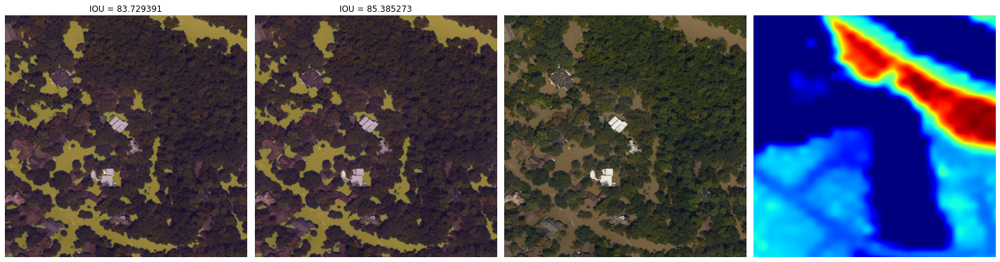

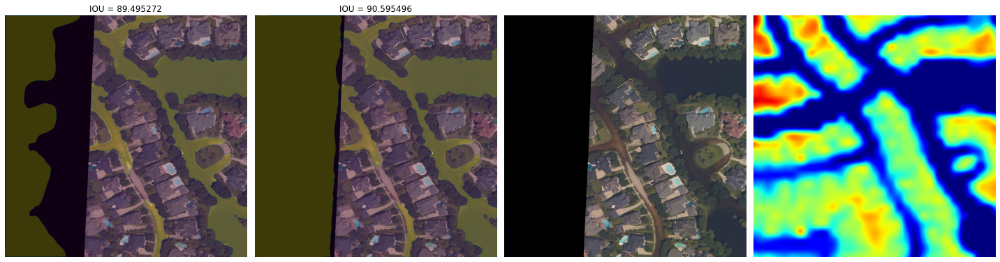

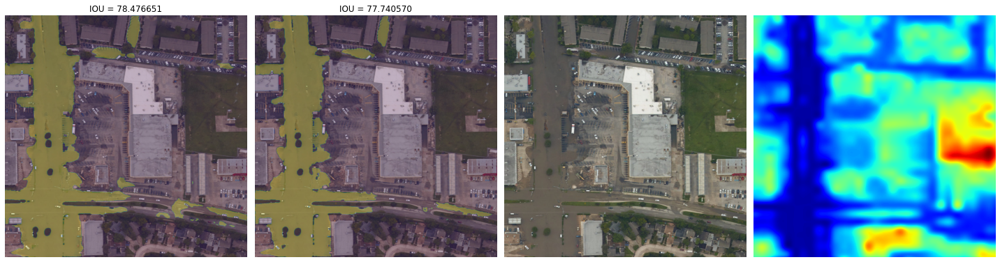

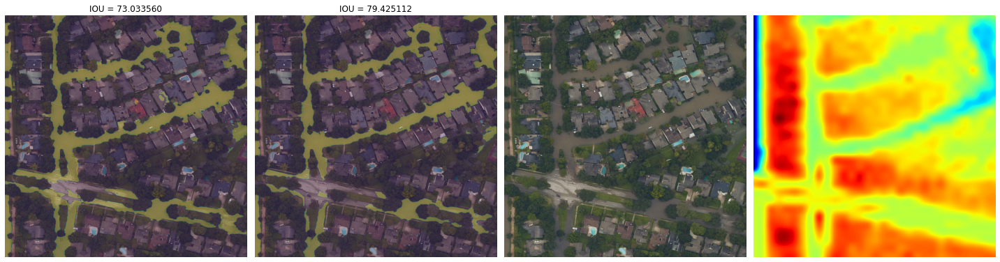

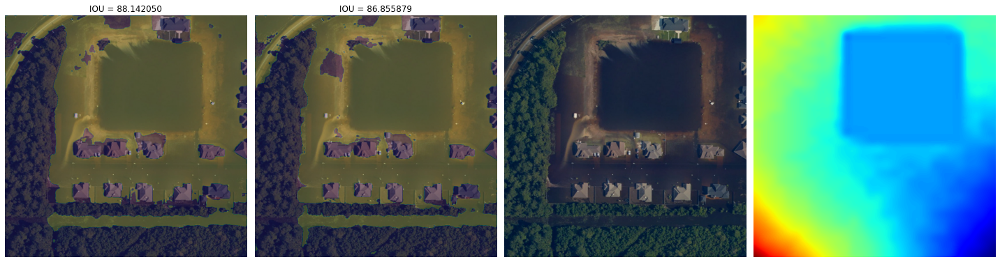

...

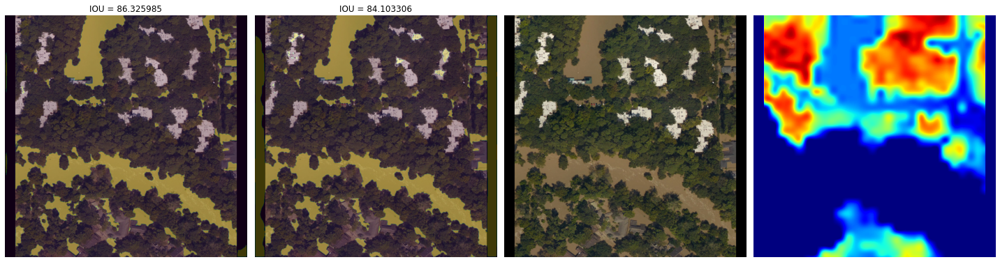

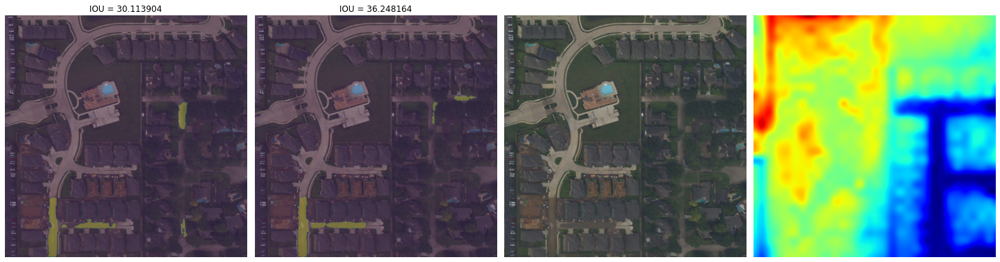

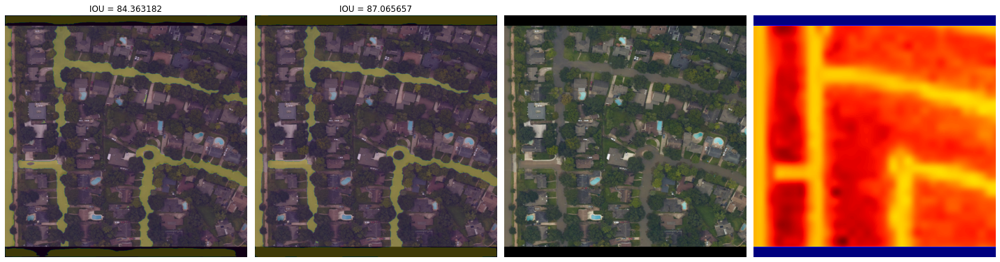

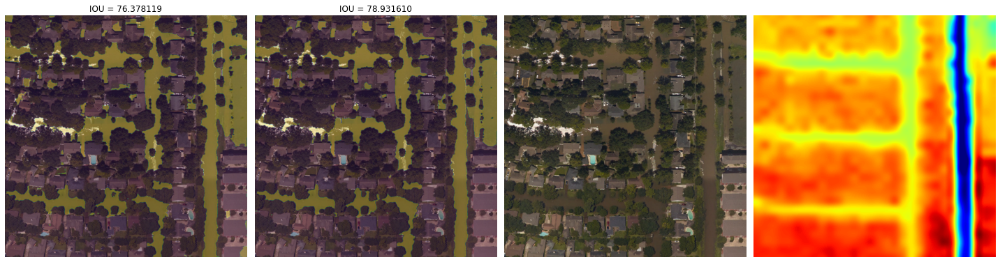

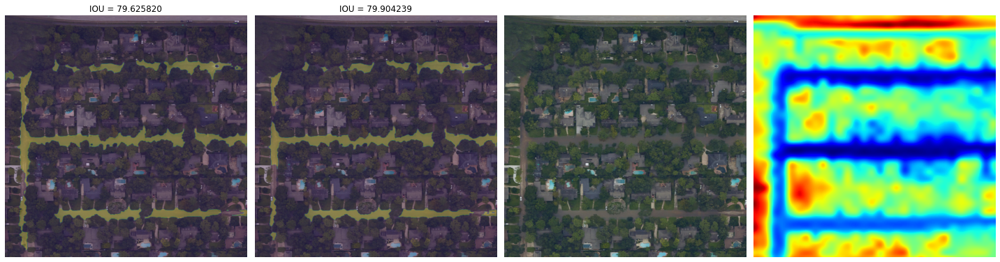

In [5]:
for j,i in enumerate(data.file[:20]):
    imgs = Image.open(os.path.join(pathData,i+'.jpg'))
    hnds = Image.open(os.path.join(pathData,i+'.tif'))
    imgNumpy = np.asarray(imgs)
    hndNumpy = np.asarray(hnds)
    imgs = TF.to_tensor(imgs)
    hndTest = TF.to_tensor(hnds)
    
    imgTestH = TF.normalize(imgs, mean=mean[:3], std=std[:3])
        
    imgs = TF.normalize(imgs, mean=imgNetMean, std=imgNetStd )
    
    hndTest = TF.normalize(hndTest, mean=mean[3:], std=std[3:])

    imgHand = torch.cat([imgTestH,hndTest])

    outHand = modelHand(imgHand.reshape(1,4,s[0],s[1]).cuda())
    outHand = outHand.detach().cpu().numpy()
    outHand = outHand.reshape(s[0],s[1])
    outHand = (outHand>.5)*1
    
    outNoHand = modelNoHand(imgs.reshape(1,3,s[0],s[1]).cuda())
    outNoHand = outNoHand.detach().cpu().numpy()
    outNoHand = outNoHand.reshape(s[0],s[1])
    outNoHand = (outNoHand>.5)*1
    
    

    #plt.figure(figsize=(10,10))
    label = Image.open(os.path.join(pathData,i+'.png'))
    label = np.asarray(label)

    fig, axs = plt.subplots(1,4,figsize=(20,20))
    im1 = axs[0].imshow(imgNumpy)
    im2 = axs[0].imshow(outHand, alpha = .25)
    
    im3 = axs[1].imshow(imgNumpy)
    im4 = axs[1].imshow(outNoHand, alpha = .25)
    
    im5 = axs[2].imshow(imgNumpy)
    im6 = axs[3].imshow(hndNumpy, cmap='jet')
    #fig.colorbar(im6, ax=axs[3],shrink=.25)
    axs[0].set_title('IOU = {:4f}'.format(L.iou_binary(outHand,label,ignore=2,per_image=False)))
    axs[1].set_title('IOU = {:4f}'.format(L.iou_binary(outNoHand,label,ignore=2,per_image=False)))
    
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    axs[3].axis('off')
    plt.tight_layout()